<a href="https://colab.research.google.com/github/Albert-GM/datascience_notebooks/blob/main/imbalanced_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### SET ENVIRONMENT

In [1]:
!pip install -U yellowbrick
!pip install scikit-optimize
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
!pip install -U keras-tuner
!pip install livelossplot

Requirement already up-to-date: yellowbrick in /usr/local/lib/python3.6/dist-packages (1.2)
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.9.0-py2.py3-none-any.whl size=258952 sha256=60c4f58af0586728960a1ade7d2e6ad269f23959057adf335fa22c4dd7b7e373
  Stored in directory: /tmp/pip-ephem-wheel-cache-mg84xvyq/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling
Requirement already up-to-date: keras-tuner in /usr/local/lib/python3.6/dist-packages (1.0.1)


In [2]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ConfusionMatrix
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
from yellowbrick.classifier import DiscriminationThreshold
from sklearn.model_selection import cross_val_score
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import average_precision_score
from joblib import dump, load
from yellowbrick.model_selection import FeatureImportances
from sklearn.feature_selection import SelectFromModel
from imblearn.under_sampling import NearMiss
from collections import Counter
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.datasets import make_classification
from yellowbrick.contrib.classifier import DecisionViz
from sklearn.metrics import accuracy_score
from kerastuner.tuners import RandomSearch
from kerastuner import Objective
from tensorflow.keras.optimizers import Nadam, Adam
from tensorflow.keras.models import  Sequential, load_model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow import keras
from sklearn import metrics
from livelossplot import PlotLossesKeras
from keras.models import Model
import time
from tensorflow.keras.metrics import AUC, Recall
from imblearn.pipeline import Pipeline as Pipe
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import  loguniform
from sklearn.metrics import f1_score
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from skopt.callbacks import DeltaYStopper

sns.set()
%matplotlib inline

# GET THE DATA

In [3]:
seed = 42 # change to get different data

X, y = make_classification(n_samples=20000, n_features=2, n_redundant=0, n_informative=2
                           , weights=[0.99], random_state=seed)

print(f"Number of features: {X.shape[1]}")
print(f"Number of samples: {X.shape[0]}")


df = pd.DataFrame(np.concatenate((X,y.reshape(-1,1)), axis=1))
df.set_axis([*df.columns[:-1], 'Class'], axis=1, inplace=True)

df['Class'] = df['Class'].astype('int')
X = df.drop('Class', axis=1)
y = df['Class']
df.head()

Number of features: 2
Number of samples: 20000


,0,1,Class
0,-1.530672,-0.095697,0
1,1.296586,0.597583,1
2,-1.005380,0.084692,0
3,-1.910244,-0.268283,0
4,0.900931,-1.144838,0


In [4]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42, )
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, stratify=y_train_val, random_state=42)

print(f"Train set: {X_train.shape}")
print(f"Validation set: {X_val.shape}")
print(f"Test set: {X_test.shape}")

Train set: (12000, 2)
Validation set: (4000, 2)
Test set: (4000, 2)


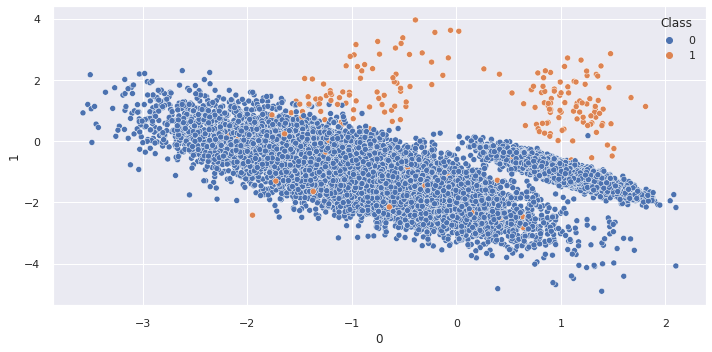

In [5]:
fig, ax = plt.subplots(1, 1, figsize = (10,5))
sns.scatterplot(X.iloc[:,0], X.iloc[:,1], hue=y, ax=ax)
plt.tight_layout()

# EDA

In [6]:
profile = ProfileReport(df, title='Pandas Profiling Report')
profile.to_notebook_iframe()

# PROMISING MODELS

In [7]:
def results(estimator, X_train, y_train, X_test, y_test, ROC=True):
  """
  Produces classification visualizers to see the perfomance of a model.
  """
  X_train, y_train, X_test, y_test = X_train.copy(), y_train.copy(), X_test.copy(), y_test.copy()
  y_pred = estimator.predict(X_test)
  y_pred_prob = estimator.predict_proba(X_test)
  y_pred_prob = np.array([x[1] for x in y_pred_prob]) # keep the prob for the positive class 1
  accuracy = accuracy_score(y_test, y_pred) 
  roc_auc = roc_auc_score(y_test, y_pred_prob)
  avg_precision = average_precision_score(y_test, y_pred_prob)
  f1 = f1_score(y_test, y_pred)
  print(f"F1-score: {f1}")
  print(f"Accuracy: {accuracy}")
  print(f"ROC_AUC: {roc_auc}")
  print(f"Average_precision: {avg_precision}")
  print('='*20)
  fig, ax = plt.subplots(2, 3, figsize=(16,10))
  viz1 = ClassificationReport(estimator, classes=['0', '1'],
                              is_fitted=True, support=True, ax=ax[0,0])
  viz1.score(X_test, y_test)       
  viz1.finalize()
  viz2 = ConfusionMatrix(estimator, classes=['0', '1'],
                         is_fitted=True, ax=ax[0,1])
  viz2.score(X_test, y_test)
  viz2.finalize()
  if ROC:
    viz3 = ROCAUC(estimator, is_fitted=True, binary=True, ax=ax[0,2])
    viz3.fit(X_train, y_train) # error when not fit
    viz3.score(X_test, y_test)
    viz3.finalize()
  viz4 = PrecisionRecallCurve(estimator, is_fitted=True, binary=True, ax=ax[1,0])
  viz4.fit(X_train, y_train) # error when not fit
  viz4.score(X_test, y_test)
  viz4.finalize()
  viz5 = DiscriminationThreshold(estimator, is_fitted=True, ax=ax[1,1])
  viz5.fit(X_train, y_train)
  viz5.finalize()
  viz6 = DecisionViz(estimator, features=['Feature One', 'Feature Two'],
                      classes=['0', '1'], is_fitted=True, ax=ax[1,2])
  viz6.fit(X_train.values, y_train.values)
  viz6.draw(X_test.values, y_test.values)
  viz6.finalize()
  plt.tight_layout()

In [8]:
scores = {}

## DUMMY CLASSIFIER

F1-score: 0.0
Accuracy: 0.98575
ROC_AUC: 0.5
Average_precision: 0.01425


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


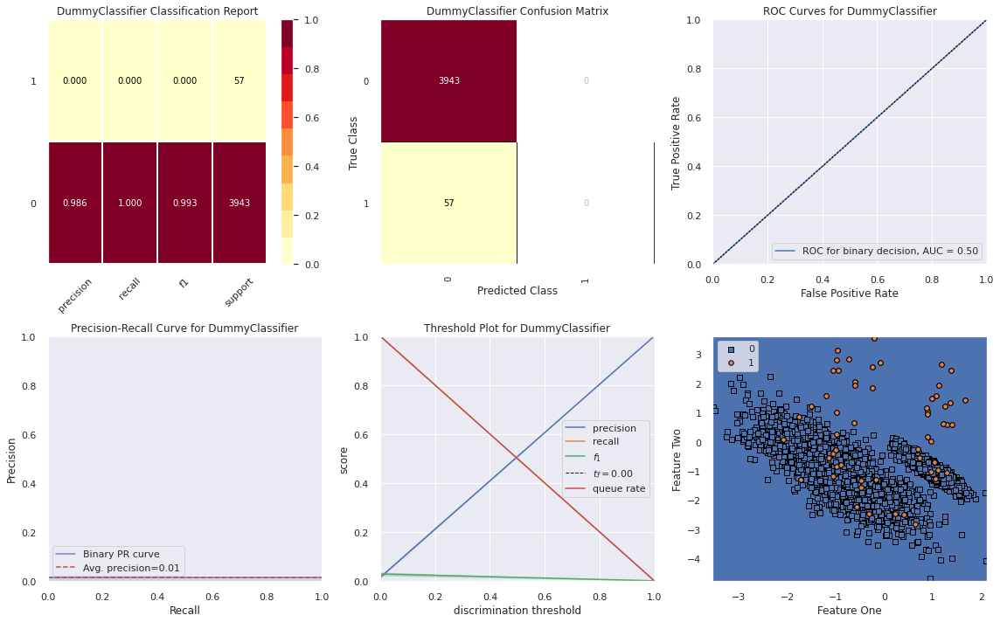

In [9]:
clf_dummy = DummyClassifier(strategy='most_frequent')
clf_dummy.fit(X_train, y_train)

results(clf_dummy, X_train, y_train, X_val, y_val)

score = cross_val_score(clf_dummy, X_train_val, y_train_val, n_jobs=-1, scoring='f1')
scores['dummy'] = [score.mean(), score.std()]

## LOGISTIC REGRESSION

F1-score: 0.5499999999999999
Accuracy: 0.991
ROC_AUC: 0.7539454774394775
Average_precision: 0.5429107678622727


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


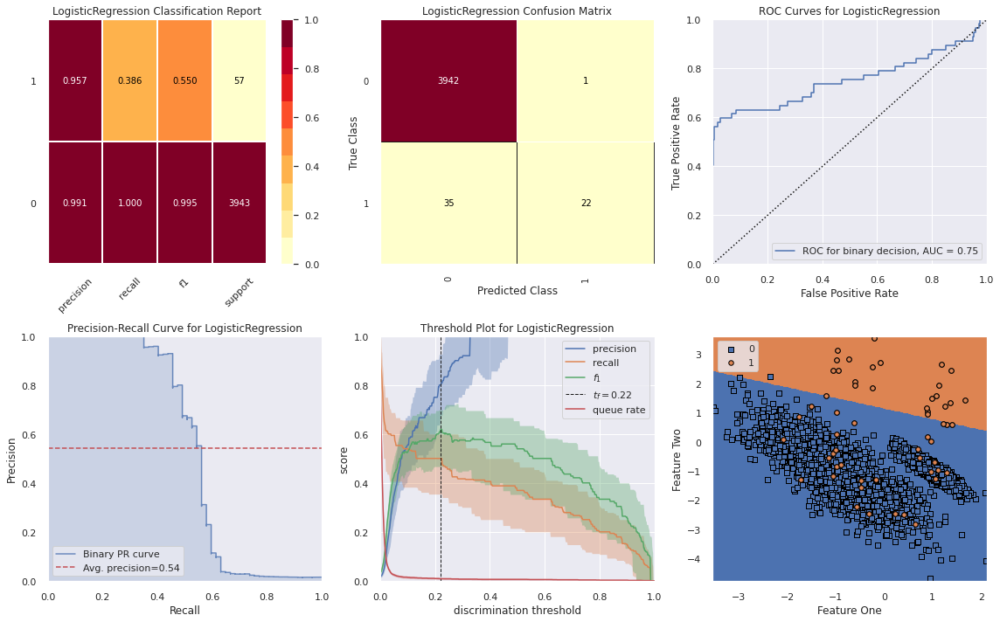

In [10]:
clf_lr = LogisticRegression()
clf_lr.fit(X_train, y_train)

results(clf_lr, X_train, y_train, X_val, y_val)

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
score = cross_val_score(clf_lr, X_train_val, y_train_val, cv=cv, n_jobs=-1, scoring='f1')
scores['logistic_regression'] = [score.mean(), score.std()]

## SVM

F1-score: 0.6097560975609756
Accuracy: 0.992
ROC_AUC: 0.7453226014567232
Average_precision: 0.5672575323538606


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


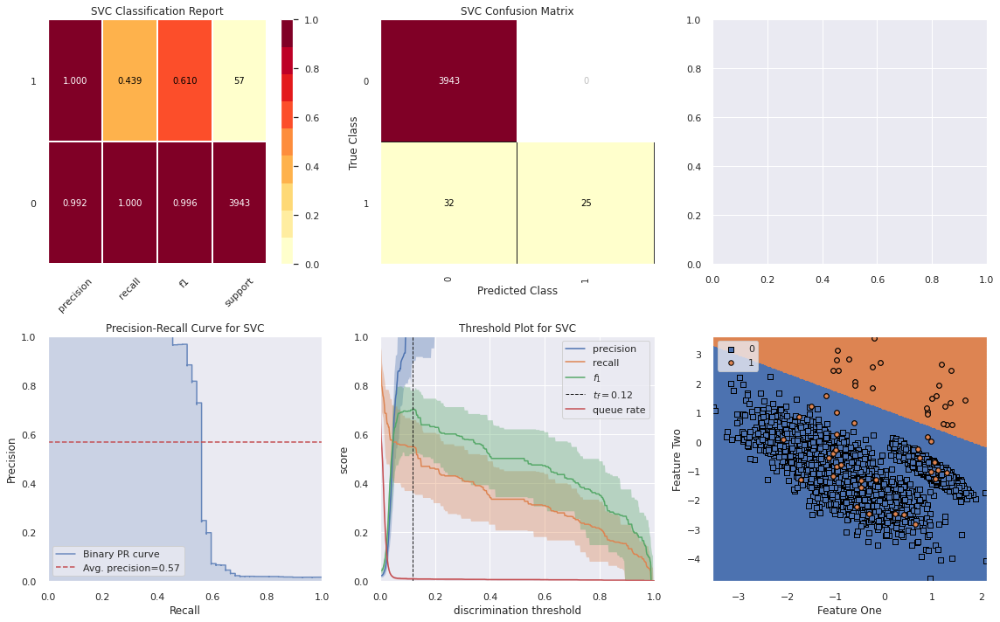

In [11]:
clf_lsvm = SVC(kernel='linear', probability=True, random_state=42)
clf_lsvm.fit(X_train, y_train)


results(clf_lsvm, X_train, y_train, X_val, y_val, ROC=False)

score = cross_val_score(clf_lsvm, X_train_val, y_train_val, cv=cv, n_jobs=-1, scoring='f1')
scores['linear_svc'] = [score.mean(), score.std()]

F1-score: 0.6265060240963854
Accuracy: 0.99225
ROC_AUC: 0.8066259994393796
Average_precision: 0.573754575014679


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


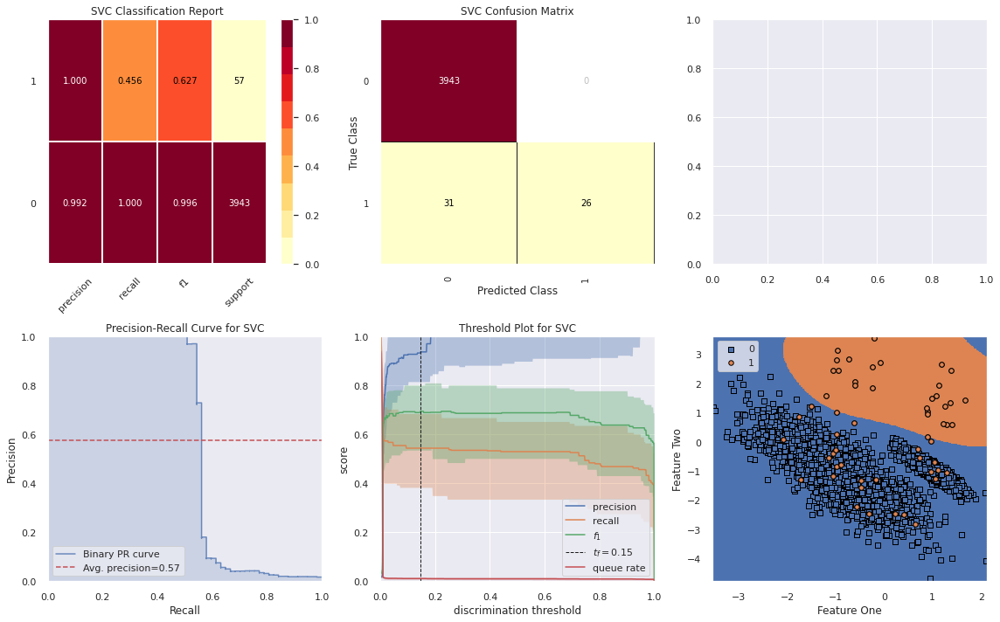

In [12]:
clf_rbfsvm = SVC(probability=True)
clf_rbfsvm.fit(X_train, y_train)

results(clf_rbfsvm, X_train, y_train, X_val, y_val, ROC=False)

score = cross_val_score(clf_rbfsvm, X_train_val, y_train_val, cv=cv, n_jobs=-1, scoring='f1')
scores['rbf_svc'] = [score.mean(), score.std()]

F1-score: 0.5
Accuracy: 0.9905
ROC_AUC: 0.7566684909077157
Average_precision: 0.5616677042450676


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


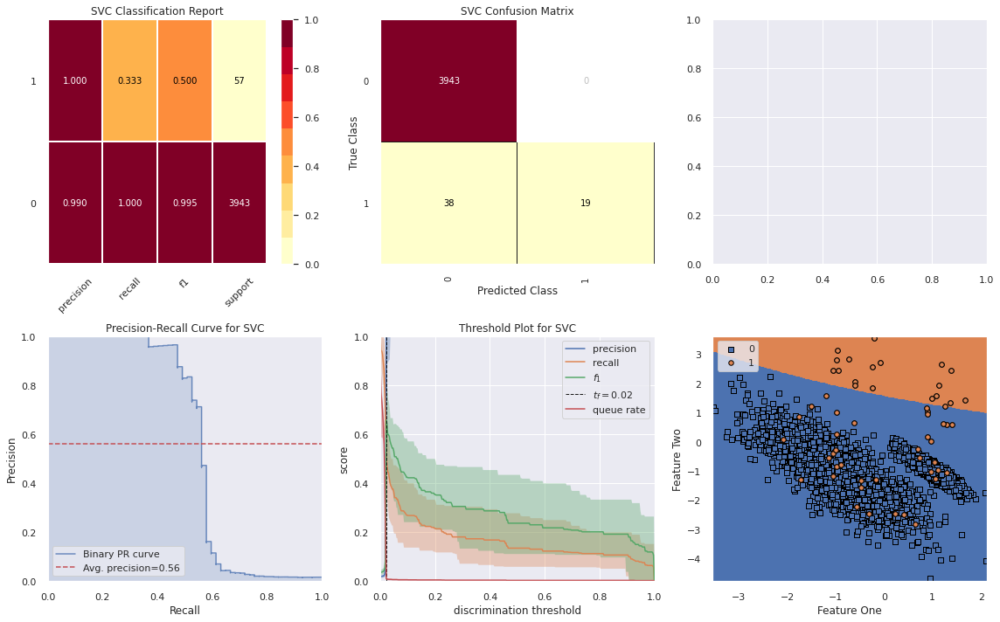

In [13]:
clf_polysvm = SVC(kernel='poly', probability=True)
clf_polysvm.fit(X_train, y_train)

results(clf_polysvm, X_train, y_train, X_val, y_val, ROC=False)

score = cross_val_score(clf_polysvm, X_train_val, y_train_val, n_jobs=-1, scoring='f1')
scores['poly_svc'] = [score.mean(), score.std()]

## DECISION TREE

F1-score: 0.5384615384615384
Accuracy: 0.988
ROC_AUC: 0.743204702092538
Average_precision: 0.2998965098917506


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


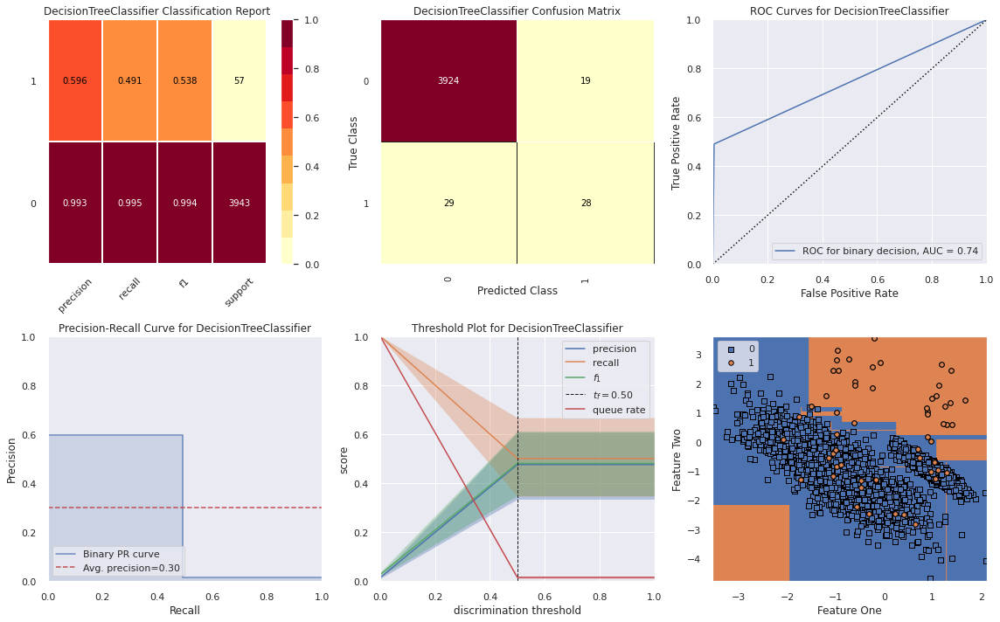

In [14]:
clf_tree = DecisionTreeClassifier()
clf_tree.fit(X_train, y_train)

results(clf_tree, X_train, y_train, X_val, y_val)

score = cross_val_score(clf_tree, X_train_val, y_train_val, cv=cv, n_jobs=-1, scoring='f1')
scores['decision_tree'] = [score.mean(), score.std()]

## RANDOM FOREST



F1-score: 0.6666666666666667
Accuracy: 0.99275
ROC_AUC: 0.7909041561550338
Average_precision: 0.5556761482977727


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,
/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


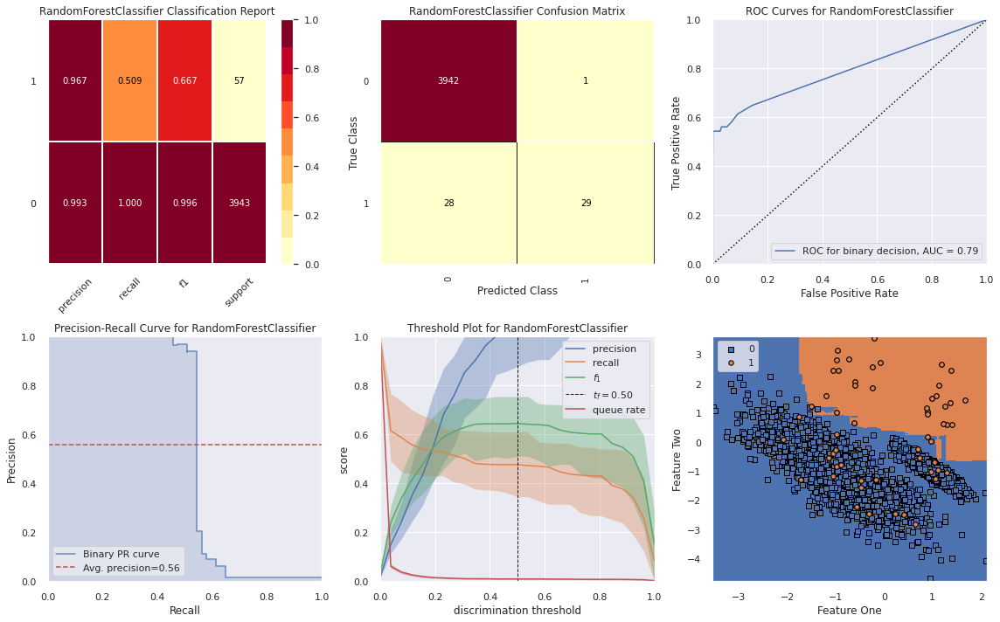

In [15]:
clf_rf = RandomForestClassifier()
clf_rf.fit(X_train, y_train)

results(clf_rf, X_train, y_train, X_val, y_val)

score = cross_val_score(clf_rf, X_train_val, y_train_val,cv=cv, n_jobs=-1, scoring='f1')
scores['random_forest'] = [score.mean(), score.std()]

## XGBOOST

F1-score: 0.6588235294117647
Accuracy: 0.99275
ROC_AUC: 0.8400518796356856
Average_precision: 0.5607264514008868


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


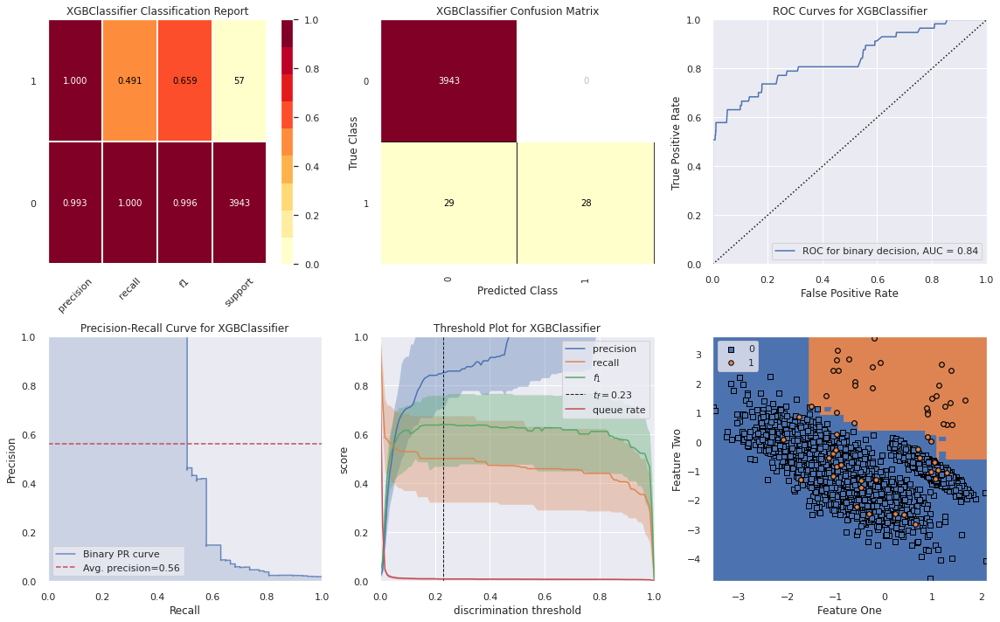

In [16]:
clf_xgb = xgb.XGBClassifier()
clf_xgb.fit(X_train, y_train)

results(clf_xgb, X_train, y_train, X_val, y_val)

score = cross_val_score(clf_xgb, X_train_val, y_train_val, cv=cv,n_jobs=-1, scoring='f1')
scores['xgboost'] = [score.mean(), score.std()]

In [17]:
# summary
df_results = pd.DataFrame(scores).T.rename(columns={0:'f1-score', 1:'std'}).sort_values(
    by='f1-score', ascending=False)
df_results

,f1-score,std
random_forest,0.672705,0.057735
xgboost,0.658657,0.054666
rbf_svc,0.633800,0.051568
linear_svc,0.528708,0.068488
decision_tree,0.510878,0.047013
logistic_regression,0.506089,0.056626
poly_svc,0.350904,0.099286
dummy,0.000000,0.000000


In [18]:
best_models_val = list(df_results.index[:2])
print(f"The best perfomance in the validation data was obtained with {best_models_val[0]} and {best_models_val[1]}")

The best perfomance in the validation data was obtained with random_forest and xgboost


# FINE-TUNE THE SYSTEM

In [19]:
max_depth = [int(x) for x in np.linspace(10, 60, num=11)]
max_depth.append(None)
search_space = dict(
    n_estimators=Integer(1,1000),
    max_features=Categorical(['auto', 'sqrt']),
    max_depth=max_depth,
    min_samples_split=Integer(2, 11),
    min_samples_leaf=Integer(1, 5),
    bootstrap=Categorical([True, False])
)

scores_search = []
i = 0   

def on_step(optim_result, n_last=3):
    """
    Callback meant to view scores after each iteration while performing Bayesian
    Optimization in Skopt. Stops the optimization if the score in the last
    n_last iterations are equal."""
    global i
    i += 1
    scores_search.append(opt.best_score_)
    print(f"best score: {scores_search[-1]}")
    if i > n_last and len(set(scores_search[i-n_last:])) <= 1:
        return True
        
opt = BayesSearchCV(RandomForestClassifier(random_state=42), search_space,
                    scoring='f1', cv=3, n_jobs=-1, 
                    verbose=1, random_state=42)


opt.fit(X_train_val, y_train_val, callback=on_step)
print("="*20)
print(f"Best score cross-val: {opt.best_score_}")
print("="*20)
print(f"Best parameters: {opt.best_params_}")

scores['random_forest_bayessearch'] = [opt.best_score_, opt.cv_results_['std_test_score'][opt.best_index_]] 

clf_rf_bayes = opt.best_estimator_

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   21.7s finished


best score: 0.6585915103199175
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.9s finished


best score: 0.6585915103199175
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   23.0s finished


best score: 0.6585915103199175
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    2.8s finished


best score: 0.6585915103199175
Best score cross-val: 0.6585915103199175
Best parameters: OrderedDict([('bootstrap', False), ('max_depth', 50), ('max_features', 'sqrt'), ('min_samples_leaf', 2), ('min_samples_split', 8), ('n_estimators', 415)])


Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


best score: 0.5790563459479633
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


best score: 0.5790563459479633
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


best score: 0.5790563459479633
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


best score: 0.5790563459479633
Best score cross-val: 0.5790563459479633
Best parameters: OrderedDict([('colsample_bytree', 0.7640415835413256), ('gamma', 2), ('learning_rate', 0.9335393188593556), ('max_depth', 10), ('n_estimators', 25), ('subsample', 0.7656474529942154)])
F1-score: 0.7045454545454546
Accuracy: 0.9935
ROC_AUC: 0.9621892672335162
Average_precision: 0.7601407079848247


/usr/local/lib/python3.6/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


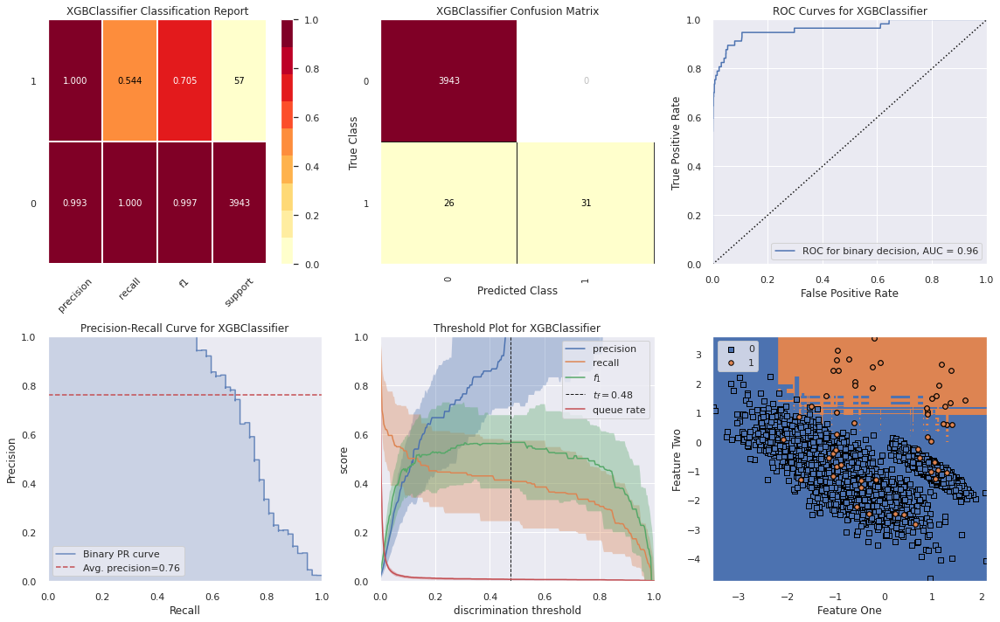

In [20]:
search_space = dict(
    n_estimators=Integer(15, 30),
    max_depth=Integer(5, 20),
    learning_rate=Real(0.01, 1),
    subsample=Real(0.6, 1),
    colsample_bytree=Real(0.6, 1),
    gamma=Integer(0,3)
)

scores_search = []
i = 0
    
opt = BayesSearchCV(xgb.XGBClassifier(random_state=42), search_space, cv=3,
                    scoring='f1', n_jobs=-1, verbose=1,
                    random_state=42)


opt.fit(X_train_val, y_train_val, callback=on_step)

print("="*20)
print(f"Best score cross-val: {opt.best_score_}")
print("="*20)
print(f"Best parameters: {opt.best_params_}")


scores['xgboost_bayessearch'] = [opt.best_score_, opt.cv_results_['std_test_score'][opt.best_index_]] 

clf_xgb_bayes = opt.best_estimator_

results(clf_xgb_bayes, X_train, y_train, X_val, y_val)

In [21]:
df_results = pd.DataFrame(scores).T.rename(columns={0:'f1-score', 1:'std'}).sort_values(
    by='f1-score', ascending=False)
df_results

,f1-score,std
random_forest,0.672705,0.057735
xgboost,0.658657,0.054666
random_forest_bayessearch,0.658592,0.021229
rbf_svc,0.633800,0.051568
xgboost_bayessearch,0.579056,0.023216
linear_svc,0.528708,0.068488
decision_tree,0.510878,0.047013
logistic_regression,0.506089,0.056626
poly_svc,0.350904,0.099286
dummy,0.000000,0.000000


## NEURAL NETWORK


In [22]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
    
def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

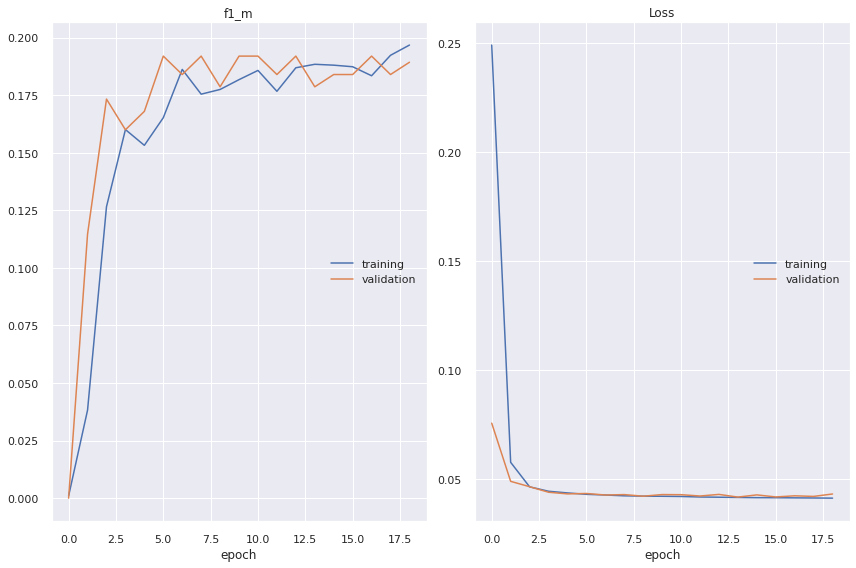

f1_m
	training         	 (min:    0.001, max:    0.197, cur:    0.197)
	validation       	 (min:    0.000, max:    0.192, cur:    0.189)
Loss
	training         	 (min:    0.041, max:    0.249, cur:    0.041)
	validation       	 (min:    0.042, max:    0.076, cur:    0.043)
Train score: 0.04147924855351448
Train accuracy: 0.18524447083473206
Test score: 0.04187171161174774
Test accuracy: 0.17866665124893188


In [23]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.astype(np.float64))
X_val_scaled = scaler.transform(X_val.astype(np.float64))

inputs = Input(shape=X_train_scaled.shape[1:])
h0 = Dense(10, activation='selu', kernel_initializer='lecun_normal')(inputs)
h1 = Dense(10, activation='selu', kernel_initializer='lecun_normal')(h0)
preds = Dense(1, activation = 'sigmoid')(h1)

early_stopping_cb = keras.callbacks.EarlyStopping(
                            patience=5, restore_best_weights=True)

model = Model(inputs=inputs, outputs=preds)
sgd = keras.optimizers.Nadam()
model.compile(optimizer=sgd, loss='binary_crossentropy', metrics=[f1_m])
history = model.fit(X_train_scaled, y_train, epochs=500, verbose=0,
                    validation_data=(X_val_scaled, y_val),
                    callbacks=[PlotLossesKeras(), early_stopping_cb]) 

score_train = model.evaluate(X_train_scaled, y_train, verbose=0)
score_test = model.evaluate(X_val_scaled, y_val, verbose=0) 
print('Train score:', score_train[0])
print('Train accuracy:', score_train[1])
print('Test score:', score_test[0])
print('Test accuracy:', score_test[1])

In [24]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [25]:
!rm -rf ./my_logs/ 
!rm -rf ./nn_trials/ 

In [26]:
root_logdir_tensorboard = 'my_logs'
%tensorboard --logdir=./my_logs

Reusing TensorBoard on port 6006 (pid 551), started 1:32:08 ago. (Use '!kill 551' to kill it.)

<IPython.core.display.Javascript object>

In [27]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.astype(np.float64))
X_val_scaled = scaler.transform(X_val.astype(np.float64))


def build_model(hp):
    model = Sequential()
    model.add(Flatten(input_shape=X_train_scaled.shape[1:]))
    units=hp.Int('units_layer', min_value=3, max_value=30, step=2)
        
    for i in range(hp.Int('num_layers', 3, 20)):
        model.add(Dense(units=units,
                               activation='selu',
                               kernel_initializer='lecun_normal'))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(
        optimizer=Nadam(),
        loss='binary_crossentropy',
            metrics=[f1_m])
    return model

tuner = RandomSearch(
  build_model,
  objective=Objective('val_f1_m', direction='max'),
  max_trials=10,
  executions_per_trial=1,
  directory='nn_trials')

tuner.search_space_summary()

tensorboard_cb = keras.callbacks.TensorBoard(root_logdir_tensorboard)
early_stopping_cb = keras.callbacks.EarlyStopping(
                            patience=5, restore_best_weights=True)


# Uncomment netxt lines to train the models
tuner.search(X_train_scaled, y_train,
            epochs=100,
            validation_data=(X_val_scaled, y_val),
            callbacks=[tensorboard_cb, early_stopping_cb])

Epoch 1/100
  1/375 [..............................] - ETA: 0s - loss: 0.7242 - f1_m: 0.2353WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
375/375 [==============================] - 4s 9ms/step - loss: 0.0588 - f1_m: 0.1502 - val_loss: 0.0435 - val_f1_m: 0.1787
Epoch 2/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0444 - f1_m: 0.1812 - val_loss: 0.0438 - val_f1_m: 0.1707
Epoch 3/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0436 - f1_m: 0.1744 - val_loss: 0.0420 - val_f1_m: 0.1707
Epoch 4/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0432 - f1_m: 0.1780 - val_loss: 0.0402 - val_f1_m: 0.2027
Epoch 5/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0415 - f1_m: 0.1939 - val

Epoch 1/100
375/375 [==============================] - 4s 10ms/step - loss: 0.0542 - f1_m: 0.1590 - val_loss: 0.0448 - val_f1_m: 0.1813
Epoch 2/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0441 - f1_m: 0.1867 - val_loss: 0.0425 - val_f1_m: 0.2027
Epoch 3/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0428 - f1_m: 0.1879 - val_loss: 0.0425 - val_f1_m: 0.1840
Epoch 4/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0413 - f1_m: 0.1835 - val_loss: 0.0423 - val_f1_m: 0.1787
Epoch 5/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0425 - f1_m: 0.1893 - val_loss: 0.0401 - val_f1_m: 0.1947
Epoch 6/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0416 - f1_m: 0.1902 - val_loss: 0.0415 - val_f1_m: 0.2027
Epoch 7/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0426 - f1_m: 0.1759 - val_loss: 0.0403 - val_f1_m: 0.1947
Epoch 8/100
375/375 [==============================] -

Epoch 1/100
375/375 [==============================] - 3s 7ms/step - loss: 0.0695 - f1_m: 0.1437 - val_loss: 0.0427 - val_f1_m: 0.1893
Epoch 2/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0427 - f1_m: 0.1900 - val_loss: 0.0429 - val_f1_m: 0.1893
Epoch 3/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0424 - f1_m: 0.1896 - val_loss: 0.0415 - val_f1_m: 0.2107
Epoch 4/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0421 - f1_m: 0.1794 - val_loss: 0.0416 - val_f1_m: 0.2027
Epoch 5/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0423 - f1_m: 0.1880 - val_loss: 0.0410 - val_f1_m: 0.1840
Epoch 6/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0422 - f1_m: 0.1965 - val_loss: 0.0421 - val_f1_m: 0.1787
Epoch 7/100
375/375 [==============================] - 2s 6ms/step - loss: 0.0412 - f1_m: 0.1861 - val_loss: 0.0410 - val_f1_m: 0.1840
Epoch 8/100
375/375 [==============================] - 

Epoch 1/100
375/375 [==============================] - 4s 10ms/step - loss: 0.0560 - f1_m: 0.1559 - val_loss: 0.0436 - val_f1_m: 0.1787
Epoch 2/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0449 - f1_m: 0.1803 - val_loss: 0.0418 - val_f1_m: 0.2053
Epoch 3/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0467 - f1_m: 0.1821 - val_loss: 0.0424 - val_f1_m: 0.1840
Epoch 4/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0440 - f1_m: 0.1798 - val_loss: 0.0421 - val_f1_m: 0.1787
Epoch 5/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0428 - f1_m: 0.1936 - val_loss: 0.0481 - val_f1_m: 0.1707
Epoch 6/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0423 - f1_m: 0.1862 - val_loss: 0.0417 - val_f1_m: 0.1840
Epoch 7/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0422 - f1_m: 0.1998 - val_loss: 0.0409 - val_f1_m: 0.1893
Epoch 8/100
375/375 [==============================] -

Epoch 1/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0616 - f1_m: 0.1572 - val_loss: 0.0446 - val_f1_m: 0.2000
Epoch 2/100
375/375 [==============================] - 3s 7ms/step - loss: 0.0432 - f1_m: 0.1897 - val_loss: 0.0420 - val_f1_m: 0.1760
Epoch 3/100
375/375 [==============================] - 3s 7ms/step - loss: 0.0423 - f1_m: 0.1804 - val_loss: 0.0430 - val_f1_m: 0.1787
Epoch 4/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0421 - f1_m: 0.1843 - val_loss: 0.0404 - val_f1_m: 0.1947
Epoch 5/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0424 - f1_m: 0.1891 - val_loss: 0.0402 - val_f1_m: 0.1947
Epoch 6/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0412 - f1_m: 0.1896 - val_loss: 0.0505 - val_f1_m: 0.1987
Epoch 7/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0413 - f1_m: 0.1932 - val_loss: 0.0411 - val_f1_m: 0.1947
Epoch 8/100
375/375 [==============================] - 

Epoch 1/100
375/375 [==============================] - 5s 13ms/step - loss: 0.0553 - f1_m: 0.1769 - val_loss: 0.0425 - val_f1_m: 0.1707
Epoch 2/100
375/375 [==============================] - 5s 12ms/step - loss: 0.0483 - f1_m: 0.1675 - val_loss: 0.0571 - val_f1_m: 0.2053
Epoch 3/100
375/375 [==============================] - 5s 12ms/step - loss: 0.0450 - f1_m: 0.1795 - val_loss: 0.0411 - val_f1_m: 0.1920
Epoch 4/100
375/375 [==============================] - 5s 12ms/step - loss: 0.0451 - f1_m: 0.1803 - val_loss: 0.0432 - val_f1_m: 0.1787
Epoch 5/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0433 - f1_m: 0.1897 - val_loss: 0.0405 - val_f1_m: 0.2000
Epoch 6/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0426 - f1_m: 0.1875 - val_loss: 0.0413 - val_f1_m: 0.1947
Epoch 7/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0434 - f1_m: 0.1947 - val_loss: 0.0464 - val_f1_m: 0.1840
Epoch 8/100
375/375 [===========================

Epoch 1/100
375/375 [==============================] - 5s 13ms/step - loss: 0.0838 - f1_m: 0.0187 - val_loss: 0.0650 - val_f1_m: 0.0560
Epoch 2/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0548 - f1_m: 0.0920 - val_loss: 0.0465 - val_f1_m: 0.1720
Epoch 3/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0457 - f1_m: 0.1764 - val_loss: 0.0447 - val_f1_m: 0.1893
Epoch 4/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0446 - f1_m: 0.1812 - val_loss: 0.0429 - val_f1_m: 0.2053
Epoch 5/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0439 - f1_m: 0.1841 - val_loss: 0.0478 - val_f1_m: 0.1440
Epoch 6/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0430 - f1_m: 0.1939 - val_loss: 0.0428 - val_f1_m: 0.1973
Epoch 7/100
375/375 [==============================] - 4s 12ms/step - loss: 0.0444 - f1_m: 0.1888 - val_loss: 0.0410 - val_f1_m: 0.2027
Epoch 8/100
375/375 [===========================

Epoch 1/100
375/375 [==============================] - 4s 10ms/step - loss: 0.0523 - f1_m: 0.1732 - val_loss: 0.0411 - val_f1_m: 0.1893
Epoch 2/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0462 - f1_m: 0.1683 - val_loss: 0.0420 - val_f1_m: 0.1840
Epoch 3/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0428 - f1_m: 0.1941 - val_loss: 0.0467 - val_f1_m: 0.2093
Epoch 4/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0433 - f1_m: 0.1793 - val_loss: 0.0413 - val_f1_m: 0.1760
Epoch 5/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0428 - f1_m: 0.1900 - val_loss: 0.0428 - val_f1_m: 0.2027
Epoch 6/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0425 - f1_m: 0.1855 - val_loss: 0.0415 - val_f1_m: 0.1893


Epoch 1/100
375/375 [==============================] - 5s 12ms/step - loss: 0.0611 - f1_m: 0.1569 - val_loss: 0.0475 - val_f1_m: 0.1600
Epoch 2/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0446 - f1_m: 0.1687 - val_loss: 0.0424 - val_f1_m: 0.1787
Epoch 3/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0434 - f1_m: 0.1719 - val_loss: 0.0404 - val_f1_m: 0.2027
Epoch 4/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0423 - f1_m: 0.1941 - val_loss: 0.0435 - val_f1_m: 0.1787
Epoch 5/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0423 - f1_m: 0.1844 - val_loss: 0.0414 - val_f1_m: 0.2093
Epoch 6/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0418 - f1_m: 0.2020 - val_loss: 0.0405 - val_f1_m: 0.1893
Epoch 7/100
375/375 [==============================] - 4s 11ms/step - loss: 0.0443 - f1_m: 0.1853 - val_loss: 0.0413 - val_f1_m: 0.2027
Epoch 8/100
375/375 [===========================

Epoch 1/100
375/375 [==============================] - 3s 9ms/step - loss: 0.0555 - f1_m: 0.1486 - val_loss: 0.0421 - val_f1_m: 0.1760
Epoch 2/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0440 - f1_m: 0.1928 - val_loss: 0.0409 - val_f1_m: 0.1893
Epoch 3/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0455 - f1_m: 0.1716 - val_loss: 0.0409 - val_f1_m: 0.1893
Epoch 4/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0420 - f1_m: 0.1866 - val_loss: 0.0443 - val_f1_m: 0.1707
Epoch 5/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0435 - f1_m: 0.1817 - val_loss: 0.0422 - val_f1_m: 0.1893
Epoch 6/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0442 - f1_m: 0.1844 - val_loss: 0.0409 - val_f1_m: 0.2027
Epoch 7/100
375/375 [==============================] - 3s 8ms/step - loss: 0.0422 - f1_m: 0.1898 - val_loss: 0.0405 - val_f1_m: 0.1893
Epoch 8/100
375/375 [==============================] - 

INFO:tensorflow:Oracle triggered exit


In [28]:
tuner.results_summary()

In [29]:
clf_nn = tuner.get_best_models(num_models=1)[0]
clf_nn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 2)                 0         
_________________________________________________________________
dense (Dense)                (None, 29)                87        
_________________________________________________________________
dense_1 (Dense)              (None, 29)                870       
_________________________________________________________________
dense_2 (Dense)              (None, 29)                870       
_________________________________________________________________
dense_3 (Dense)              (None, 29)                870       
_________________________________________________________________
dense_4 (Dense)              (None, 29)                870       
_________________________________________________________________
dense_5 (Dense)              (None, 29)                8

In [30]:
# validation set
y_pred_proba = clf_nn.predict(X_val_scaled)
y_pred = np.where(y_pred_proba>0.5, 1, 0)

accuracy = accuracy_score(y_val, y_pred) 
roc_auc = roc_auc_score(y_val, y_pred_proba)
avg_precision = average_precision_score(y_val, y_pred_proba)
f1 = f1_score(y_val, y_pred)
print(f"F1-score: {f1}")
print(f"Accuracy: {accuracy}")
print(f"ROC_AUC: {roc_auc}")
print(f"Average_precision: {avg_precision}")
print('='*20)
report = metrics.classification_report(y_val, y_pred)
print('='*20)
print(report)
print('='*20)
matrix = metrics.confusion_matrix(y_val, y_pred)
print(matrix)

scores['neural_network'] = [f1, '-'] 

F1-score: 0.6666666666666666
Accuracy: 0.992
ROC_AUC: 0.7902256274721803
Average_precision: 0.5923276882110715
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3943
           1       0.82      0.56      0.67        57

    accuracy                           0.99      4000
   macro avg       0.91      0.78      0.83      4000
weighted avg       0.99      0.99      0.99      4000

[[3936    7]
 [  25   32]]


In [31]:
# summary with neural network included
df_results = pd.DataFrame(scores).T.rename(columns={0:'f1-score', 1:'std'}).sort_values(
    by='f1-score', ascending=False)
df_results

,f1-score,std
random_forest,0.672705,0.0577348
neural_network,0.666667,-
xgboost,0.658657,0.054666
random_forest_bayessearch,0.658592,0.0212285
rbf_svc,0.6338,0.0515683
xgboost_bayessearch,0.579056,0.0232164
linear_svc,0.528708,0.0684875
decision_tree,0.510878,0.0470134
logistic_regression,0.506089,0.0566264
poly_svc,0.350904,0.099286


# UNDERSAMPLING

In [32]:
scores_sampling = {}

In [33]:
# example of undersampling 
print(Counter(y_train))
X_train_under, y_train_under = NearMiss().fit_resample(X_train, y_train)
print(Counter(y_train_under))

Counter({0: 11827, 1: 173})
Counter({0: 173, 1: 173})


In [34]:
pipe_rf_under = Pipe([
                      ('scaler', StandardScaler()),
                      ('under', NearMiss()),
                      ('estimator', clf_xgb_bayes)
])

score = cross_val_score(pipe_rf_under, X_train_val, y_train_val, cv=cv, scoring='f1', n_jobs=-1)
scores_sampling['xgboost_under'] = [score.mean(), score.std()]

# OVERSAMPLING

In [35]:
# example of oversampling 
print(Counter(y_train))
X_train_over, y_train_over = SMOTE().fit_resample(X_train, y_train)
print(Counter(y_train_over))

Counter({0: 11827, 1: 173})
Counter({0: 11827, 1: 11827})


In [36]:
pipe_rf_over = Pipe([
                      ('scaler', StandardScaler()),
                      ('over', SMOTE()),
                      ('estimator', clf_xgb_bayes)
])

score = cross_val_score(pipe_rf_over, X_train_val, y_train_val, cv=cv, scoring='f1', n_jobs=-1)
scores_sampling['xgboost_over'] = [score.mean(), score.std()]

# UNDERSAMPLING + OVERSAMPLING

In [37]:
# example of oversampling + undersmapling 
print(Counter(y_train))

pipe_over_under = Pipe([
                      ('over', SMOTE(sampling_strategy=0.1)),
                      ('under', RandomUnderSampler(sampling_strategy=0.5))
])

X_train_over, y_train_over = pipe_over_under.fit_resample(X_train, y_train)
print(Counter(y_train_over))

Counter({0: 11827, 1: 173})
Counter({0: 2364, 1: 1182})


In [38]:
pipe_rf_over_under = Pipe([
                      ('over', SMOTE(sampling_strategy=0.1)),
                      ('under', RandomUnderSampler(sampling_strategy=0.5)),
                      ('estimator', clf_xgb_bayes)
])

score = cross_val_score(pipe_rf_over_under, X_train_val.values, y_train_val.values, cv=cv, scoring='f1', n_jobs=-1)
scores_sampling['xgboost_over_under'] = [score.mean(), score.std()]

In [39]:
# summary sampling
df_results = pd.DataFrame(scores_sampling).T.rename(columns={0:'f1-score', 1:'std'}).sort_values(
    by='f1-score', ascending=False)
df_results

,f1-score,std
xgboost_over_under,0.149084,0.017589
xgboost_over,0.101783,0.006708
xgboost_under,0.032248,0.001263


# PREDICTIONS

The neural network gets the best performance in this data set. The last step is to measure its performance on the test set to estimate the generalization error:

In [41]:
# test set, neural network
y_pred = clf_rf.predict(X_test)
y_pred_prob = clf_rf.predict_proba(X_test)
y_pred_prob = np.array([x[1] for x in y_pred_prob]) # keep the prob for the positive class 1

accuracy = accuracy_score(y_test, y_pred) 
roc_auc = roc_auc_score(y_test, y_pred_prob)
avg_precision = average_precision_score(y_test, y_pred_prob)
f1 = f1_score(y_test, y_pred)
print(f"F1-score: {f1}")
print(f"Accuracy: {accuracy}")
print(f"ROC_AUC: {roc_auc}")
print(f"Average_precision: {avg_precision}")
print('='*20)
report = metrics.classification_report(y_test, y_pred)
print(report)
print('='*20)
matrix = metrics.confusion_matrix(y_test, y_pred)
print(matrix)

F1-score: 0.7446808510638299
Accuracy: 0.994
ROC_AUC: 0.8101209783271264
Average_precision: 0.6342611594504761
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3943
           1       0.95      0.61      0.74        57

    accuracy                           0.99      4000
   macro avg       0.97      0.81      0.87      4000
weighted avg       0.99      0.99      0.99      4000

[[3941    2]
 [  22   35]]


# CONCLUSIONS

We have been able to see how different models behave with the dataset and what type of errors each model makes. As it is an unbalanced dataset, it is important to choose the appropriate metrics to evaluate the models, in this case the f1-score, since I give more importance to the positive class.

The best performance with all the data has been obtained with a random forest, followed by a neural network. I have used other techniques such as undersampling, oversampling and a combination of both, techniques suited for imbalanced data sets. The best performance with sampling techniques was with oversampling + undersampling.